In [40]:
# Import library for pretrained baseline model
!pip install segmentation-models-pytorch

The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.


In [41]:
import os
from glob import glob
import imageio.v3 as imageio

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split
from torch.optim.lr_scheduler import ReduceLROnPlateau

import segmentation_models_pytorch as smp
from timm.models.vision_transformer import vit_base_patch16_224

import albumentations as A
from albumentations.pytorch import ToTensorV2
import matplotlib.pyplot as plt

from datasets import load_dataset
from tqdm import tqdm
from itertools import product
import copy

In [43]:
device = torch.device('cuda')
seed = 42

# Göttingen Dataset

In [29]:
class SegmDataset(Dataset):
    def __init__(self, images, masks, transform=None):
        self.images = images
        self.masks = masks
        self.transform = transform

    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):
        image = self.images[idx]
        mask = self.masks[idx]
        
        if self.transform:
            augmented = self.transform(image=image, mask=mask)
            image = augmented["image"]
            mask = augmented["mask"]  
        
        return image, mask

In [30]:
# Load images and masks into memory
data_folder = "/kaggle/input/tree-cover-segmentation/treecover_segmentation_aerial_goettingen/"

image_paths = glob(os.path.join(data_folder, "tiles", "*.tif"))
image_paths.sort()
mask_paths = glob(os.path.join(data_folder, "masks", "*.tif"))
mask_paths.sort()

images = [imageio.imread(path) for path in image_paths]
masks = [imageio.imread(path) for path in mask_paths]

images = np.array(images).astype('float32')
masks = np.array(masks).astype('float32')

In [31]:
trainsize, valsize = 30, 8

# Mean and std of the dataset for all 4 channels
mean = (0.4048, 0.3980, 0.3848, 0.5288)
std = (0.1306, 0.1102, 0.0995, 0.1303)

trainset, valset = random_split(
    SegmDataset(images, masks), 
    [trainsize, valsize], 
    generator=torch.Generator().manual_seed(seed),     
)

trainset.dataset = copy.deepcopy(trainset.dataset) 
valset.dataset = copy.deepcopy(valset.dataset) 

# Model is trained on cropped images to match ViT input
# D4 transform flips and rotates image for augmentation
trainset.dataset.transform = A.Compose([
    A.RandomCrop(height=224, width=224), 
    A.D4(p=1), 
    A.Normalize(mean=mean, std=std), 
    ToTensorV2(), 
])

# Model is validated on uncropped images with a sliding window and no augmentation
valset.dataset.transform = A.Compose([
    A.Normalize(mean=mean, std=std), 
    ToTensorV2(), 
])

trainloader = DataLoader(
    trainset, 
    batch_size=trainsize, 
    shuffle=True,
)
valloader = DataLoader(
    valset, 
    batch_size=valsize, 
    shuffle=False,     
)

# ViT Import

In [51]:
checkpoint_path = "/kaggle/input/mae-vit-base/mae_vit_base_backbone.ckpt"
checkpoint = torch.load(checkpoint_path, weights_only=True)

vit = vit_base_patch16_224(num_classes=0, in_chans=4)
vit.load_state_dict(checkpoint)

vit.to(device);

In [50]:
def remove_NiR_channel(vit):
    ''' Removes NiR input channel from vision transformer to process RGB images (used for TCD Dataset) '''
    # Get the original projection weights [out_dim, in_dim=4, patch_h, patch_w]
    original_weight = vit.patch_embed.proj.weight  # shape: [768, 4, 16, 16]
    
    # Remove last input channel (keeping first 3 channels)
    new_weight = vit.patch_embed.proj.weight[:, :3, :, :].clone()
    
    # Create new projection layer for 3 channels
    new_proj = torch.nn.Conv2d(
        in_channels=3,
        out_channels=original_weight.shape[0],
        kernel_size=vit.patch_embed.proj.kernel_size,
        stride=vit.patch_embed.proj.stride,
        padding=vit.patch_embed.proj.padding,
        bias=True
    )
    new_proj.weight.data.copy_(new_weight)
    new_proj.bias.data.copy_(vit.patch_embed.proj.bias)
    
    # Replace the projection layer
    vit.patch_embed.proj = new_proj

Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))

# Training Code

In [32]:
def get_features(model, x):
    ''' Passes the input through the ViT model and saves the outputs after every transformer block '''
    features = []

    x = model.patch_embed(x)
    x = x + model.pos_embed[:, 1:, :]  # Drop CLS token pos embedding
    x = model.pos_drop(x)
    
    for block in model.blocks:
        x = block(x)
        features.append(x)

    return features

In [33]:
def iou_score(logits, targets, threshold=0.5):
    ''' Computes IOU score with binarized model predictions '''
    # Convert logits to probabilities and apply threshold
    probs = torch.sigmoid(logits)
    preds = (probs > threshold).float()
    
    # Flatten tensors
    preds = preds.view(-1)
    targets = targets.view(-1)
    
    intersection = (preds * targets).sum()
    union = (preds + targets).sum() - intersection
    
    # Handle empty union case
    iou = (intersection + 1e-6) / (union + 1e-6)
    return iou.item()

In [34]:
class DiceBCELoss(nn.Module):
    ''' Hybrid loss function to combine dice and BCE loss with custom weights '''
    def __init__(self, dice_weight=0.5, bce_weight=0.5, smooth=1.0):
        super().__init__()
        self.dice_weight = dice_weight
        self.bce_weight = bce_weight
        self.smooth = smooth

    def forward(self, logits, targets):
        # Automatic sigmoid via BCEWithLogitsLoss
        bce_loss = F.binary_cross_entropy_with_logits(logits, targets)
        
        # Dice component (differentiable, operates on probabilities)
        probs = torch.sigmoid(logits)
        probs_flat = probs.view(-1)
        targets_flat = targets.view(-1)
        
        intersection = (probs_flat * targets_flat).sum()
        dice_coeff = (2. * intersection + self.smooth) / (probs_flat.sum() + targets_flat.sum() + self.smooth)
        dice_loss = 1 - dice_coeff
        
        # Weighted combination
        total_loss = (self.bce_weight * bce_loss + 
                     self.dice_weight * dice_loss)
        
        return total_loss

In [83]:
def sliding_window(decoder, full_image, backbone=None, size=224, stride=32, sigma=0.5):
    ''' 
    Applies the decodder model in a sliding window to the 'full_image'. If backbone is given
    it gets applied before the decoder. 'size' and 'stride' controll the sliding window and 
    'sigma' constrolls the scale of the gausian weighting kernel. Normalize output by tracking 
    kernel weights added to every pixel.
    '''
    # Computes gausian weighting kernel
    ax = torch.linspace(-1, 1, size, dtype=torch.float32)
    xx, yy = torch.meshgrid(ax, ax, indexing='ij')
    kernel = torch.exp(-(xx**2 + yy**2) / (2. * sigma**2))
    
    B, C, H, W = full_image.shape
    pred_sum = torch.zeros((B, 1, H, W), dtype=torch.float32)
    normalization = torch.zeros((B, 1, H, W), dtype=torch.float32)

    # Make sure the stride value lines up to match the image size
    assert (H - size) % stride == 0
    steps = range(0, H - size + 1, stride)
    
    for x, y in product(steps, steps):
        image = full_image[:, :, x:(x + size), y:(y + size)]  # Crop image
        image = image.to(device, non_blocking=True)
        
        with torch.no_grad():
            # Apply backbone if given
            if backbone: 
                features = get_features(backbone, image)
                pred = decoder(features)
            else:
                pred = decoder(image)
            
        pred_sum[:, :, x:(x + size), y:(y + size)] += kernel * pred.cpu()
        normalization[:, :, x:(x + size), y:(y + size)] += kernel

    return pred_sum / normalization            

In [80]:
def train(
    decoder, trainloader, valloader, optim, criterion, backbone=None, validate_every=100, 
    max_epochs=2000, num_lr_decays=2, validation_stride=80, validation_sigma=2
):
    '''
    Flexible training function for decoders and potential backbones that reduces learning rate on plateau. 
    User can use any dataloaders, optimizers and criterions. The validation uses the 'sliding window function' 
    with specifiable parameters while the training happens on trainloader images directly. 
    '''
    scheduler = ReduceLROnPlateau(
        optim, mode='min', factor=0.25, patience=5
    )
    
    curr_lr_decays = 0
    debug_loss = 0

    with tqdm(total=validate_every, desc="Next validation", unit="epoch") as pbar:
        for epoch in range(max_epochs):
            decoder.train()
    
            # Train
            for batch in trainloader:
                image, target = batch
                image = image.to(device, non_blocking=True)
                target = target.unsqueeze(1).to(device, non_blocking=True)

                optim.zero_grad()
                
                if backbone:
                    features = get_features(backbone, image)
                    pred = decoder(features)
                else:
                    pred = decoder(image)
            
                loss = criterion(pred, target)
                loss.backward()
                optim.step()
            
                debug_loss += loss.item()
    
            pbar.update(1)  # Progress bar update

            # Validate
            if epoch % validate_every == validate_every - 1:
                decoder.eval()
                iou = 0
                
                for batch in valloader:
                    image, target = batch
                    pred = sliding_window(decoder, image, backbone, stride=validation_stride, sigma=validation_sigma)    
                    
                    iou += iou_score(pred, target)
        
                avg_iou = iou / len(valloader)
                # Retrive learning rate before and after ReduceLROnPlateau for early stopping 
                last_lr = optim.param_groups[0]['lr']
                scheduler.step(avg_iou)
                curr_lr = optim.param_groups[0]['lr']
                    
                print(f"Epoch {epoch} | Train Loss: {debug_loss / validate_every:.4f}| Val IOU: {avg_iou:.4f} | LR step: {curr_lr_decays} with {curr_lr:.8f}")
                
                debug_loss = 0
    
                pbar.reset()
                pbar.set_description(f"Next validation (Epoch {epoch+1}-{epoch+validate_every})")

                # After 'num_lr_decays' stop the training early
                if last_lr != curr_lr:
                    curr_lr_decays += 1
                    if curr_lr_decays > num_lr_decays:
                        print(f"Stopping early after {epoch} epochs. ")
                        break

In [93]:
from matplotlib.colors import ListedColormap, BoundaryNorm

def plot_results(decoder, dataloader, num_imgs, backbone=None, threshold=0.5, filename=None):
    ''' Plots the images/targers from 'dataloader' along with the 'decoder' predictions and the IOU visualization '''
    images, targets = next(iter(dataloader))
    
    preds = sliding_window(decoder, images, backbone)
    
    images = images.detach().cpu().numpy()
    targets = targets.detach().cpu().numpy()
    preds = preds.detach().cpu().numpy()
    
    fig, ax = plt.subplots(num_imgs, 4, figsize=(24, 48))
    
    for i, (img, trg, prd) in enumerate(zip(images, targets, preds)):
        if i == num_imgs: break
        ax[i, 0].imshow((img.transpose(1, 2, 0) * np.array(std) + np.array(mean))[..., :3])
        ax[i, 0].axis('off')
        ax[i, 0].set_title('Input') if i == 0 else None
        
        ax[i, 1].imshow(trg.squeeze(), cmap='gray')
        ax[i, 1].axis('off')
        ax[i, 1].set_title('Target') if i == 0 else None
        
        ax[i, 2].imshow(prd.squeeze(), cmap='gray')
        ax[i, 2].axis('off')
        ax[i, 2].set_title('Prediction') if i == 0 else None

        ax[i, 3].imshow((prd.squeeze() > 0.5) + trg.squeeze(), cmap=ListedColormap(['black', 'red', 'white']))
        ax[i, 3].axis('off')
        ax[i, 3].set_title('Intersection over Union') if i == 0 else None
    
    plt.tight_layout()
    if filename:
        plt.savefig(filename)
    plt.show()

# Baseline ResNext

In [84]:
model = smp.Unet(
    encoder_name="resnext50_32x4d", # Use ResNext as encoder
    encoder_weights="imagenet",     # use ImageNet pre-trained weights for encoder 
    in_channels=4,                  # input channels RGB + NIR
    classes=1,
)
model.to(device);

In [85]:
criterion = DiceBCELoss(bce_weight=0.5, dice_weight=0.5)

# Uses reduced learning rate for pretrained encoder
params = [
    {'params': model.encoder.parameters(), 'lr': 1e-5}, 
    {'params': model.decoder.parameters(), 'lr': 1e-3}, 
    {'params': model.segmentation_head.parameters(), 'lr': 1e-3}, 
]

optimizer = torch.optim.AdamW(params)

train(model, trainloader, valloader, optimizer, criterion, validate_every=100)

Next validation (Epoch 100-199):   0%|          | 0/100 [00:00<?, ?epoch/s]

Epoch 99 | Train Loss: 0.2547| Val IOU: 0.7290 | LR step: 0 with 0.00001000


Next validation (Epoch 200-299):   0%|          | 0/100 [00:00<?, ?epoch/s]          

Epoch 199 | Train Loss: 0.1769| Val IOU: 0.7327 | LR step: 0 with 0.00001000


Next validation (Epoch 300-399):   0%|          | 0/100 [00:00<?, ?epoch/s]          

Epoch 299 | Train Loss: 0.1597| Val IOU: 0.7513 | LR step: 0 with 0.00001000


Next validation (Epoch 400-499):   0%|          | 0/100 [00:00<?, ?epoch/s]          

Epoch 399 | Train Loss: 0.1554| Val IOU: 0.7545 | LR step: 0 with 0.00001000


Next validation (Epoch 500-599):   0%|          | 0/100 [00:00<?, ?epoch/s]          

Epoch 499 | Train Loss: 0.1448| Val IOU: 0.7456 | LR step: 0 with 0.00001000


Next validation (Epoch 600-699):   0%|          | 0/100 [00:00<?, ?epoch/s]          

Epoch 599 | Train Loss: 0.1379| Val IOU: 0.7607 | LR step: 0 with 0.00001000


Next validation (Epoch 700-799):   0%|          | 0/100 [00:00<?, ?epoch/s]          

Epoch 699 | Train Loss: 0.1297| Val IOU: 0.7585 | LR step: 0 with 0.00000250


Next validation (Epoch 800-899):   0%|          | 0/100 [00:00<?, ?epoch/s]          

Epoch 799 | Train Loss: 0.1239| Val IOU: 0.7719 | LR step: 1 with 0.00000250


Next validation (Epoch 900-999):   0%|          | 0/100 [00:00<?, ?epoch/s]          

Epoch 899 | Train Loss: 0.1181| Val IOU: 0.7708 | LR step: 1 with 0.00000250


Next validation (Epoch 1000-1099):   0%|          | 0/100 [00:00<?, ?epoch/s]        

Epoch 999 | Train Loss: 0.1172| Val IOU: 0.7690 | LR step: 1 with 0.00000250


Next validation (Epoch 1100-1199):   0%|          | 0/100 [00:00<?, ?epoch/s]          

Epoch 1099 | Train Loss: 0.1135| Val IOU: 0.7700 | LR step: 1 with 0.00000250


Next validation (Epoch 1200-1299):   0%|          | 0/100 [00:00<?, ?epoch/s]          

Epoch 1199 | Train Loss: 0.1123| Val IOU: 0.7703 | LR step: 1 with 0.00000250


Next validation (Epoch 1300-1399):   0%|          | 0/100 [00:00<?, ?epoch/s]          

Epoch 1299 | Train Loss: 0.1101| Val IOU: 0.7699 | LR step: 1 with 0.00000063


Next validation (Epoch 1400-1499):   0%|          | 0/100 [00:00<?, ?epoch/s]          

Epoch 1399 | Train Loss: 0.1065| Val IOU: 0.7700 | LR step: 2 with 0.00000063


Next validation (Epoch 1500-1599):   0%|          | 0/100 [00:00<?, ?epoch/s]          

Epoch 1499 | Train Loss: 0.1065| Val IOU: 0.7700 | LR step: 2 with 0.00000063


Next validation (Epoch 1600-1699):   0%|          | 0/100 [00:00<?, ?epoch/s]          

Epoch 1599 | Train Loss: 0.1051| Val IOU: 0.7679 | LR step: 2 with 0.00000063


Next validation (Epoch 1700-1799):   0%|          | 0/100 [00:00<?, ?epoch/s]          

Epoch 1699 | Train Loss: 0.1054| Val IOU: 0.7697 | LR step: 2 with 0.00000063


Next validation (Epoch 1800-1899):   0%|          | 0/100 [00:00<?, ?epoch/s]          

Epoch 1799 | Train Loss: 0.1019| Val IOU: 0.7700 | LR step: 2 with 0.00000063


Next validation (Epoch 1900-1999):   0%|          | 0/100 [00:00<?, ?epoch/s]          

Epoch 1899 | Train Loss: 0.1033| Val IOU: 0.7670 | LR step: 2 with 0.00000016
Stopping early after 1899 epochs. 


In [88]:
model.eval();

In [89]:
images, targets = next(iter(valloader))
preds = sliding_window(model, images)

print('Final Validation IOU:', iou_score(preds, targets, threshold=0.5))

Final Validation IOU: 0.7660173177719116


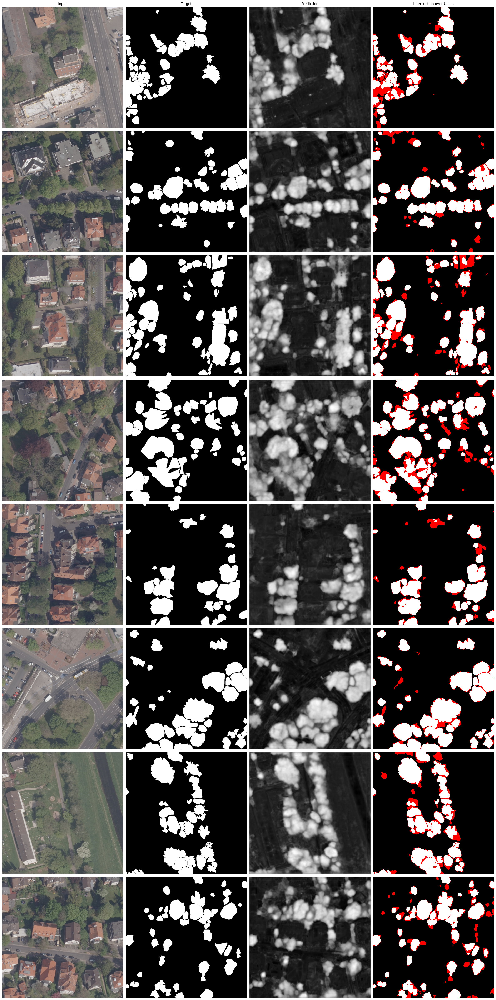

In [94]:
plot_results(model, valloader, 8, filename='results.png')

# U-Style Decoder

In [52]:
class UBlock(nn.Module):
    ''' 
    Single block of the u-style decoder.

    Parameters
    ----------
    in_c : int
        Number of input channels.
    out_c : int
        Number of output channels.
    feature_scale : int
        Scale factor to match ViT feature with input.
    up_scale : int
        Scale factor to upscale input with.
    vit_dim : int
        Number of channels to expect from ViT features.

    Attributes
    ----------
    up : nn.Sequential
        Upscales the input passed through the block.
    match: nn.Sequential
        Upscales the ViT feature to match the input dimensions.
    block:
        Conv block with two layers to process the concatenated input and feature.
        
    '''
    def __init__(self, in_c, out_c, feature_scale, up_scale, vit_dim):
        super().__init__()
        
        self.up = nn.Sequential(
            nn.ConvTranspose2d(in_c, out_c, kernel_size=up_scale, stride=up_scale), 
            nn.BatchNorm2d(out_c), 
            nn.ReLU(), 
        )
        
        self.match = nn.Sequential(
            nn.ConvTranspose2d(vit_dim, out_c, kernel_size=feature_scale, stride=feature_scale), 
            nn.BatchNorm2d(out_c), 
            nn.ReLU(), 
        )

        self.block = nn.Sequential(
            nn.Conv2d(2 * out_c, out_c, kernel_size=3, padding='same'), 
            nn.BatchNorm2d(out_c), 
            nn.ReLU(), 
            nn.Conv2d(out_c, out_c, kernel_size=3, padding='same'), 
            nn.BatchNorm2d(out_c), 
            nn.ReLU(), 
        )

    def forward(self, x, feature):
        ''' Upscale input and ViT feature, concatenate them and pass them through the block. '''
        x = self.up(x)
        feature = self.match(feature)

        x = torch.cat([x, feature], axis=1)
        x = self.block(x)
        
        return x

class UStyleDecoder(nn.Module):
    '''
    U-style decoder to utilize and combine feature information at different stages of the ViT encoder.

    Parameters
    ----------
    feature_idcs : list
        Indices of ViT blocks whos outputs to use.
    channels : list
        Input channels to every block.
    scales : list
        Scale for every block.
    up_scale : int
        Scaling factor to upsacle input in every block.

    Attributes
    ----------
    base : nn.Sequential
        First conv block that only proccesses the last ViT feature.
    blocks : nn.ModuleList
        List of blocks with their in/out channels and scaling factors.
    out : nn.Conv2
        Final conv layer to map to single output channel.
    '''
    def __init__(
        self, 
        feature_idcs=[11, 9, 7, 5, 3], 
        channels=[768, 256, 64, 16, 4], 
        scales=[2, 4, 8, 16], 
        up_scale=2, 
    ):
        super().__init__()

        self.feature_idcs = feature_idcs

        self.base = nn.Sequential(
            nn.Conv2d(channels[0], channels[0], kernel_size=3, padding='same'), 
            nn.BatchNorm2d(channels[0]), 
            nn.ReLU(), 
            nn.Conv2d(channels[0], channels[0], kernel_size=3, padding='same'), 
            nn.BatchNorm2d(channels[0]), 
            nn.ReLU(), 
        )

        self.blocks = nn.ModuleList([
            UBlock(in_c, out_c, scale, up_scale=up_scale, vit_dim=channels[0]) 
            for in_c, out_c, scale in zip(
                channels[:-1], channels[1:], scales, 
            )
        ])

        self.out = nn.Conv2d(channels[-1], 1, kernel_size=3, padding='same')

    def forward(self, features):
        B, P, D = features[0].shape
        H_patch = W_patch = int(P ** 0.5)
        
        features = [features[i] for i in self.feature_idcs]

        # Reshape transformer features to match spatial dimensions
        x = features[0].permute(0, 2, 1).reshape(B, D, H_patch, W_patch)
        x = self.base(x)
        
        for feature, block in zip(features[1:], self.blocks):
            # Reshape transformer features to match spatial dimensions
            feature = feature.permute(0, 2, 1).reshape(B, D, H_patch, W_patch)
            x = block(x, feature)

        return self.out(x)

In [53]:
# Decoder with one base block and two upscaling blocks
decoder = UStyleDecoder(
    feature_idcs=[11, 7, 3], 
    channels=[768, 96, 12], 
    scales=[4, 16], 
    up_scale=4, 
)
decoder.to(device);

In [54]:
criterion = DiceBCELoss(bce_weight=0.5, dice_weight=0.5)

# Uses reduced learning rate for pretrained encoder
params = [
    {'params': vit.parameters(), 'lr': 1e-5}, 
    {'params': decoder.parameters(), 'lr': 1e-3}, 
]

optimizer = torch.optim.AdamW(params)

train(decoder, trainloader, valloader, optimizer, criterion, backbone=vit, validate_every=100)

Next validation (Epoch 100-199):   0%|          | 0/100 [00:00<?, ?epoch/s]

Epoch 99 | Train Loss: 0.3294| Val IOU: 0.7023 | LR step: 0 with 0.00001000


Next validation (Epoch 200-299):   0%|          | 0/100 [00:00<?, ?epoch/s]          

Epoch 199 | Train Loss: 0.2084| Val IOU: 0.7168 | LR step: 0 with 0.00001000


Next validation (Epoch 300-399):   0%|          | 0/100 [00:00<?, ?epoch/s]          

Epoch 299 | Train Loss: 0.1817| Val IOU: 0.7300 | LR step: 0 with 0.00001000


Next validation (Epoch 400-499):   0%|          | 0/100 [00:00<?, ?epoch/s]          

Epoch 399 | Train Loss: 0.1716| Val IOU: 0.7510 | LR step: 0 with 0.00001000


Next validation (Epoch 500-599):   0%|          | 0/100 [00:00<?, ?epoch/s]          

Epoch 499 | Train Loss: 0.1577| Val IOU: 0.7553 | LR step: 0 with 0.00001000


Next validation (Epoch 600-699):   0%|          | 0/100 [00:00<?, ?epoch/s]          

Epoch 599 | Train Loss: 0.1540| Val IOU: 0.7559 | LR step: 0 with 0.00001000


Next validation (Epoch 700-799):   0%|          | 0/100 [00:00<?, ?epoch/s]          

Epoch 699 | Train Loss: 0.1465| Val IOU: 0.7564 | LR step: 0 with 0.00000250


Next validation (Epoch 800-899):   0%|          | 0/100 [00:00<?, ?epoch/s]          

Epoch 799 | Train Loss: 0.1374| Val IOU: 0.7615 | LR step: 1 with 0.00000250


Next validation (Epoch 900-999):   0%|          | 0/100 [00:00<?, ?epoch/s]          

Epoch 899 | Train Loss: 0.1325| Val IOU: 0.7602 | LR step: 1 with 0.00000250


Next validation (Epoch 1000-1099):   0%|          | 0/100 [00:00<?, ?epoch/s]        

Epoch 999 | Train Loss: 0.1321| Val IOU: 0.7629 | LR step: 1 with 0.00000250


Next validation (Epoch 1100-1199):   0%|          | 0/100 [00:00<?, ?epoch/s]          

Epoch 1099 | Train Loss: 0.1281| Val IOU: 0.7645 | LR step: 1 with 0.00000250


Next validation (Epoch 1200-1299):   0%|          | 0/100 [00:00<?, ?epoch/s]          

Epoch 1199 | Train Loss: 0.1283| Val IOU: 0.7618 | LR step: 1 with 0.00000250


Next validation (Epoch 1300-1399):   0%|          | 0/100 [00:00<?, ?epoch/s]          

Epoch 1299 | Train Loss: 0.1251| Val IOU: 0.7642 | LR step: 1 with 0.00000063


Next validation (Epoch 1400-1499):   0%|          | 0/100 [00:00<?, ?epoch/s]          

Epoch 1399 | Train Loss: 0.1211| Val IOU: 0.7628 | LR step: 2 with 0.00000063


Next validation (Epoch 1500-1599):   0%|          | 0/100 [00:00<?, ?epoch/s]          

Epoch 1499 | Train Loss: 0.1170| Val IOU: 0.7630 | LR step: 2 with 0.00000063


Next validation (Epoch 1600-1699):   0%|          | 0/100 [00:00<?, ?epoch/s]          

Epoch 1599 | Train Loss: 0.1175| Val IOU: 0.7623 | LR step: 2 with 0.00000063


Next validation (Epoch 1700-1799):   0%|          | 0/100 [00:00<?, ?epoch/s]          

Epoch 1699 | Train Loss: 0.1159| Val IOU: 0.7607 | LR step: 2 with 0.00000063


Next validation (Epoch 1800-1899):   0%|          | 0/100 [00:00<?, ?epoch/s]          

Epoch 1799 | Train Loss: 0.1165| Val IOU: 0.7634 | LR step: 2 with 0.00000063


Next validation (Epoch 1900-1999):   0%|          | 0/100 [00:00<?, ?epoch/s]          

Epoch 1899 | Train Loss: 0.1164| Val IOU: 0.7627 | LR step: 2 with 0.00000016
Stopping early after 1899 epochs. 


In [55]:
decoder.eval();

In [56]:
images, targets = next(iter(valloader))
preds = sliding_window(decoder, vit, images)

print('Final Validation IOU:', iou_score(preds, targets, threshold=0.5))

Final Validation IOU: 0.7633180618286133


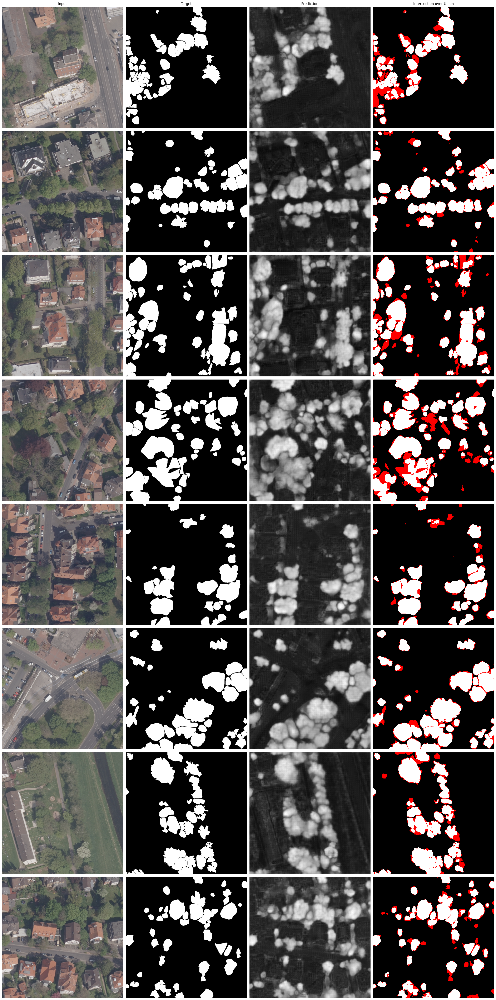

In [95]:
plot_results(decoder, valloader, 8, vit, filename='results.png')

# TCD Dataset (Legacy code)

In [ ]:
tcd_dataset = load_dataset("restor/tcd")

invalid_idcs = []
for i, example in enumerate(tcd_dataset['train']):
    if np.array(example['image']).shape != (2048, 2048, 3):
        invalid_idcs.append(i)
        print(i)

# invalid_idcs: [255, 648, 728, 1446, 1524, 1910, 1911, 2887, 3011, 3886, 4105, 4107]

valid_idcs = []
for idx in range(len(tcd_dataset['train'])):
    if idx not in invalid_idcs:
        valid_idcs.append(idx)

filtered_dataset = tcd_dataset['train'].select(valid_idcs)

class TCDDataset(Dataset):
    def __init__(self, hf_dataset, transform=None):
        self.dataset = hf_dataset
        self.transform = transform

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        item = self.dataset[idx]
        image = np.array(item["image"])
        mask = np.array(item["annotation"])

        mask = np.any(mask != 0, axis=2).astype(np.float32)
            
        if self.transform:
            augmented = self.transform(image=image, mask=mask)

            image = augmented['image']
            mask = augmented['mask']
        
        assert image.shape[0] == 3
        return image, mask

total = filtered_dataset.num_rows
trainsize = int(0.8 * total)
valsize = total - trainsize

mean = (0.485, 0.456, 0.406)
std = (0.229, 0.224, 0.225)

transform = A.Compose([
    A.RandomCrop(height=224, width=224), 
    A.D4(p=1), 
    A.Normalize(mean=mean, std=std), 
    ToTensorV2(), 
])

trainset, valset = random_split(
    TCDDataset(filtered_dataset, transform=transform), 
    [trainsize, valsize], 
    generator=torch.Generator().manual_seed(seed), 
)

trainloader = DataLoader(
    trainset, 
    batch_size=64, 
    shuffle=True,  
    num_workers=4,        # Parallel CPU loading
    pin_memory=True,      # Enables fast GPU transfer
    persistent_workers=True  # Maintains workers between epochs
)

valloader = DataLoader(
    valset, 
    batch_size=64, 
    shuffle=False, 
    num_workers=4,        # Parallel CPU loading
    pin_memory=True,      # Enables fast GPU transfer
    persistent_workers=True  # Maintains workers between epochs
)

batch_images, batch_masks = next(iter(trainloader))

fig, ax = plt.subplots(2, 5, figsize=(20, 8))

for i, (img, mask) in enumerate(zip(batch_images, batch_masks)):
    if i == 5: break
    unnormalized = img.permute(1, 2, 0) * np.array(std) + np.array(mean)
    
    ax[0][i].imshow(unnormalized[:, :, :3])
    ax[1][i].imshow(mask, cmap='gray')
    ax[0][i].axis('off')
    ax[1][i].axis('off')

plt.tight_layout()
plt.show()